# Enriquecimento por spacial join

Primeiro, mudo o working directory para um nível anterior para poder utilizar o módulo hydra

In [94]:
%cd '/git/hydra'

/git/hydra


Carrego as bibliotecas e variáveis de ambiente

In [123]:
import geopandas as gpd
import pandas as pd
from dotenv import load_dotenv
import seaborn as sns
from copy import copy

from hydra import defs
from hydra.config.geosampa import GeosampaConfig
from hydra.utils.geopandas.folium import plot_gdfs

load_dotenv()
sns.set_theme()

Carrego as configurações das camadas do arquivo de configuração

In [96]:
conf = GeosampaConfig.get_asset_config().get("geosampa")
conf

{'area_contaminada_reabilitada_svma': {'properties': ['geometry',
   'cd_identificador_area_contaminada_reabilitada',
   'dc_classificacao_area_contaminada',
   'dc_tipo_terreno_area_contaminada',
   'dc_uso_anterior_geral',
   'dc_uso_pretendido_geral',
   'tx_contaminante',
   'tx_restricao'],
  'predicate': 'intersects'},
 'area_inundavel': {'properties': ['geometry'], 'predicate': 'intersects'},
 'distrito_municipal': {'properties': ['geometry',
   'cd_identificador_distrito',
   'cd_distrito_municipal',
   'cd_identificador_subprefeitura',
   'nm_distrito_municipal',
   'sg_distrito_municipal'],
  'predicate': 'covered_by'},
 'GEOSAMPA_cadparcs_area_protecao_apa': {'properties': ['geometry',
   'nm_esfera_administrativa',
   'nm_area_protecao_ambiental',
   'tx_instrumento_legal_criacao'],
  'predicate': 'intersects'},
 'manancial_billings': {'properties': ['geometry',
   'dc_classe',
   'sg_classe',
   'dc_area_especial',
   'nm_bacia'],
  'predicate': 'intersects'},
 'manancial_

# Preparando os GeoDataFrames

In [97]:
setor = defs.load_asset_value('setor_censitario_enriched')
setor = gpd.GeoDataFrame(setor)
print(setor.shape)
setor.head()

INFO:alembic.runtime.migration:Context impl SQLiteImpl.
INFO:alembic.runtime.migration:Will assume non-transactional DDL.
INFO:alembic.runtime.migration:Running stamp_revision  -> ec80dd91891a
INFO:alembic.runtime.migration:Context impl SQLiteImpl.
INFO:alembic.runtime.migration:Will assume non-transactional DDL.
INFO:alembic.runtime.migration:Running stamp_revision  -> ec80dd91891a
INFO:alembic.runtime.migration:Context impl SQLiteImpl.
INFO:alembic.runtime.migration:Will assume non-transactional DDL.
INFO:alembic.runtime.migration:Running stamp_revision  -> ec80dd91891a
INFO:alembic.runtime.migration:Context impl SQLiteImpl.
INFO:alembic.runtime.migration:Will assume non-transactional DDL.
INFO:alembic.runtime.migration:Running stamp_revision  -> ec80dd91891a
2023-10-26 19:04:26 +0000 - dagster - INFO - system - Loading S3 object from: silver-db/dagster/setor_censitario_enriched.parquet


(18953, 19)


,cd_original_setor_censitario,geometry,Cod_setor,Domicilio01_SP1_V001,Domicilio01_SP1_V002,Domicilio01_SP1_V012,Domicilio01_SP1_V013,Domicilio01_SP1_V014,Domicilio01_SP1_V017,Domicilio01_SP1_V018,Domicilio01_SP1_V019,Domicilio01_SP1_V020,Domicilio01_SP1_V021,Domicilio01_SP1_V035,Domicilio01_SP1_V039,Domicilio01_SP1_V040,Domicilio01_SP1_V041,missing,supressed
0,355030801000001,"POLYGON ((339816.876 7392593.185, 339762.085 7...",355030801000001,268.0,266.0,266.0,0.0,0.0,266.0,0.0,0.0,0.0,0.0,265.0,0.0,1.0,0.0,False,False
1,355030801000002,"POLYGON ((339898.791 7392663.965, 339890.991 7...",355030801000002,306.0,306.0,306.0,0.0,0.0,306.0,0.0,0.0,0.0,0.0,306.0,0.0,0.0,0.0,False,False
2,355030801000003,"POLYGON ((340010.027 7392443.461, 339999.011 7...",355030801000003,189.0,189.0,189.0,0.0,0.0,187.0,1.0,1.0,0.0,0.0,189.0,0.0,0.0,0.0,False,False
3,355030801000004,"POLYGON ((340035.826 7392138.185, 339960.781 7...",355030801000004,181.0,181.0,181.0,0.0,0.0,181.0,0.0,0.0,0.0,0.0,181.0,0.0,0.0,0.0,False,False
4,355030801000005,"POLYGON ((339655.092 7392153.506, 339647.532 7...",355030801000005,240.0,240.0,240.0,0.0,0.0,240.0,0.0,0.0,0.0,0.0,240.0,0.0,0.0,0.0,False,False


In [98]:
distrito = defs.load_asset_value('distrito_municipal')
distrito = gpd.GeoDataFrame(distrito)
print(distrito.shape)
distrito.head()

INFO:alembic.runtime.migration:Context impl SQLiteImpl.
INFO:alembic.runtime.migration:Will assume non-transactional DDL.
INFO:alembic.runtime.migration:Running stamp_revision  -> ec80dd91891a
INFO:alembic.runtime.migration:Context impl SQLiteImpl.
INFO:alembic.runtime.migration:Will assume non-transactional DDL.
INFO:alembic.runtime.migration:Running stamp_revision  -> ec80dd91891a
INFO:alembic.runtime.migration:Context impl SQLiteImpl.
INFO:alembic.runtime.migration:Will assume non-transactional DDL.
INFO:alembic.runtime.migration:Running stamp_revision  -> ec80dd91891a
INFO:alembic.runtime.migration:Context impl SQLiteImpl.
INFO:alembic.runtime.migration:Will assume non-transactional DDL.
INFO:alembic.runtime.migration:Running stamp_revision  -> ec80dd91891a
2023-10-26 19:04:29 +0000 - dagster - DEBUG - system - Loading S3 object from: s3://bronze-db/dagster/distrito_municipal


(96, 14)


,geometry,cd_identificador_distrito,cd_identificador_subprefeitura,cd_distrito_municipal,nm_distrito_municipal,sg_distrito_municipal,tx_escala,sg_fonte_original,dt_criacao,dt_atualizacao,cd_usuario_atualizacao,cd_tipo_discrepancia,qt_area_quilometro,qt_area_metro
0,"POLYGON ((330950.373 7407837.176, 330952.177 7...",8583394,4,51,MANDAQUI,MAN,None,GEOGSG,2004-01-01Z,2023-05-17T13:37:48.163Z,None,199299399,13.248,1.324786e+07
1,"POLYGON ((336124.090 7355302.282, 336121.755 7...",8583395,27,52,MARSILAC,MAR,None,GEOGSG,2004-01-01Z,2023-05-17T13:37:48.163Z,None,199299399,208.196,2.081957e+08
2,"POLYGON ((331242.174 7392162.324, 331244.581 7...",8583396,20,32,MOEMA,MOE,None,GEOGSG,2004-01-01Z,2023-05-17T13:37:48.163Z,None,199299399,9.080,9.079516e+06
3,"POLYGON ((355108.237 7393291.184, 355107.277 7...",8583471,12,31,GUAIANASES,GUA,None,GEOGSG,2004-01-01Z,2023-05-17T13:37:48.163Z,None,199299399,8.939,8.938527e+06
4,"POLYGON ((350859.949 7389599.855, 350880.182 7...",8583472,17,33,IGUATEMI,IGU,None,GEOGSG,2004-01-01Z,2023-05-17T13:37:48.163Z,None,199299399,19.584,1.958356e+07


Filtro as colunas do gdf de distritos com base nas configuações

In [99]:
distrito_cols = conf.get('distrito_municipal').get('properties')
distrito = distrito[distrito_cols]
distrito

,geometry,cd_identificador_distrito,cd_distrito_municipal,cd_identificador_subprefeitura,nm_distrito_municipal,sg_distrito_municipal
0,"POLYGON ((330950.373 7407837.176, 330952.177 7...",8583394,51,4,MANDAQUI,MAN
1,"POLYGON ((336124.090 7355302.282, 336121.755 7...",8583395,52,27,MARSILAC,MAR
2,"POLYGON ((331242.174 7392162.324, 331244.581 7...",8583396,32,20,MOEMA,MOE
3,"POLYGON ((355108.237 7393291.184, 355107.277 7...",8583471,31,12,GUAIANASES,GUA
4,"POLYGON ((350859.949 7389599.855, 350880.182 7...",8583472,33,17,IGUATEMI,IGU
...,...,...,...,...,...,...
91,"POLYGON ((321265.375 7388006.570, 321292.309 7...",8583457,17,23,CAMPO LIMPO,CLM
92,"POLYGON ((322952.516 7394978.618, 323250.620 7...",8583480,41,13,JAGUARE,JRE
93,"POLYGON ((319172.403 7405179.204, 319174.204 7...",8583481,42,1,JARAGUA,JAR
94,"POLYGON ((352915.621 7402621.049, 352944.248 7...",8583482,44,9,JARDIM HELENA,JDH


Filtro o gdf de setores apenas para setores que possuem domicílios privados (`missing==False`) e seleciono apenas as colunas de identificação e geometria

In [100]:
setor = setor[setor['missing']==False]
setor = setor[['cd_original_setor_censitario', 'geometry']]
setor

,cd_original_setor_censitario,geometry
0,355030801000001,"POLYGON ((339816.876 7392593.185, 339762.085 7..."
1,355030801000002,"POLYGON ((339898.791 7392663.965, 339890.991 7..."
2,355030801000003,"POLYGON ((340010.027 7392443.461, 339999.011 7..."
3,355030801000004,"POLYGON ((340035.826 7392138.185, 339960.781 7..."
4,355030801000005,"POLYGON ((339655.092 7392153.506, 339647.532 7..."
...,...,...
18948,355030896000243,"POLYGON ((358263.250 7395587.106, 358263.354 7..."
18949,355030896000244,"POLYGON ((358308.049 7395452.215, 358307.823 7..."
18950,355030896000245,"POLYGON ((354654.416 7398105.552, 354676.451 7..."
18951,355030896000246,"POLYGON ((354778.438 7398059.051, 354812.268 7..."


In [101]:
apa = defs.load_asset_value('GEOSAMPA_cadparcs_area_protecao_apa')
apa

INFO:alembic.runtime.migration:Context impl SQLiteImpl.
INFO:alembic.runtime.migration:Will assume non-transactional DDL.
INFO:alembic.runtime.migration:Running stamp_revision  -> ec80dd91891a
INFO:alembic.runtime.migration:Context impl SQLiteImpl.
INFO:alembic.runtime.migration:Will assume non-transactional DDL.
INFO:alembic.runtime.migration:Running stamp_revision  -> ec80dd91891a
INFO:alembic.runtime.migration:Context impl SQLiteImpl.
INFO:alembic.runtime.migration:Will assume non-transactional DDL.
INFO:alembic.runtime.migration:Running stamp_revision  -> ec80dd91891a
INFO:alembic.runtime.migration:Context impl SQLiteImpl.
INFO:alembic.runtime.migration:Will assume non-transactional DDL.
INFO:alembic.runtime.migration:Running stamp_revision  -> ec80dd91891a
2023-10-26 19:04:30 +0000 - dagster - DEBUG - system - Loading S3 object from: s3://bronze-db/dagster/GEOSAMPA_cadparcs_area_protecao_apa


,geometry,cd_identificador_cadparcs_area_protecao_apa,nm_esfera_administrativa,nm_area_protecao_ambiental,qt_area_metro,tx_instrumento_legal_criacao,dt_atualizacao
0,"MULTIPOLYGON (((355344.216 7391939.347, 355328...",1,Estadual,Iguatemi,2.969825e+05,Lei Est. 8.284/93,2022-07-25Z
1,"MULTIPOLYGON (((323605.674 7366933.611, 323641...",5,Municipal,Borore-Colonia,8.939458e+07,Lei Mun. 14.162/06,2022-07-25Z
2,"MULTIPOLYGON (((333595.230 7361936.959, 333766...",4,Municipal,Capivari-Monos,2.516106e+08,Lei Mun. 13.136/01,2022-07-25Z
3,"MULTIPOLYGON (((347846.132 7391228.248, 347965...",2,Estadual,Parque e Fazenda do Carmo,8.655897e+06,Lei Est. 6.409/89 e Dec. 37.678/93,2022-07-25Z
4,"MULTIPOLYGON (((341614.967 7399726.193, 341612...",3,Estadual,Varzea do Tiete,1.467714e+07,Lei Est. 5.598/87,2022-07-25Z


In [102]:
apa = apa[conf.get('GEOSAMPA_cadparcs_area_protecao_apa').get('properties')]
apa

,geometry,nm_esfera_administrativa,nm_area_protecao_ambiental,tx_instrumento_legal_criacao
0,"MULTIPOLYGON (((355344.216 7391939.347, 355328...",Estadual,Iguatemi,Lei Est. 8.284/93
1,"MULTIPOLYGON (((323605.674 7366933.611, 323641...",Municipal,Borore-Colonia,Lei Mun. 14.162/06
2,"MULTIPOLYGON (((333595.230 7361936.959, 333766...",Municipal,Capivari-Monos,Lei Mun. 13.136/01
3,"MULTIPOLYGON (((347846.132 7391228.248, 347965...",Estadual,Parque e Fazenda do Carmo,Lei Est. 6.409/89 e Dec. 37.678/93
4,"MULTIPOLYGON (((341614.967 7399726.193, 341612...",Estadual,Varzea do Tiete,Lei Est. 5.598/87


# Spatial join 1:* por interseção e buffer negativo

Crio uma coluna com buffer negativo e defino como coluna de geometria do gdf de setores censitários

In [113]:
_neg_buffer = -5
setor.loc[:, 'neg_buffer'] = setor['geometry'].buffer(_neg_buffer)
setor = setor.set_geometry('neg_buffer')
setor.head()

,cd_original_setor_censitario,geometry,neg_buffer
0,355030801000001,"POLYGON ((339816.876 7392593.185, 339762.085 7...","POLYGON ((339811.755 7392597.939, 339762.474 7..."
1,355030801000002,"POLYGON ((339898.791 7392663.965, 339890.991 7...","POLYGON ((339899.095 7392678.294, 339895.768 7..."
2,355030801000003,"POLYGON ((340010.027 7392443.461, 339999.011 7...","POLYGON ((340005.485 7392446.082, 339996.059 7..."
3,355030801000004,"POLYGON ((340035.826 7392138.185, 339960.781 7...","POLYGON ((339810.123 7392962.457, 339813.419 7..."
4,355030801000005,"POLYGON ((339655.092 7392153.506, 339647.532 7...","POLYGON ((339655.932 7392160.639, 339651.503 7..."


<Axes: >

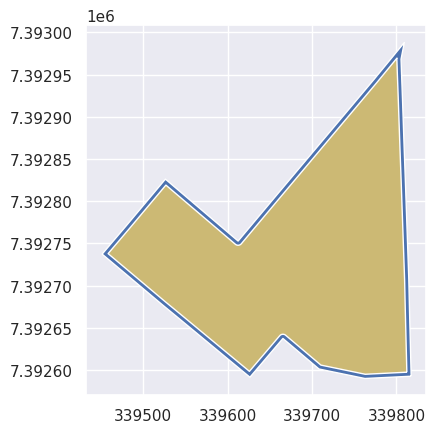

In [114]:
_setor = setor[0:1]
ax = _setor['geometry'].plot()
_setor['neg_buffer'].plot(ax=ax, color='y')

Confirmo se existe alguma geometria invalida

In [115]:
setor[~setor['neg_buffer'].is_valid]

,cd_original_setor_censitario,geometry,neg_buffer


In [116]:
setor[setor.is_empty]

,cd_original_setor_censitario,geometry,neg_buffer


Não existindo, prossigo para o spatial join

In [17]:
setor_apa = setor.sjoin(apa, how='left', predicate='intersects')
setor_apa

,cd_original_setor_censitario,geometry,neg_buffer,index_right,nm_esfera_administrativa,nm_area_protecao_ambiental,tx_instrumento_legal_criacao
0,355030801000001,"POLYGON ((339816.876 7392593.185, 339762.085 7...","POLYGON ((339795.314 7392956.582, 339795.357 7...",NaN,NaN,NaN,NaN
1,355030801000002,"POLYGON ((339898.791 7392663.965, 339890.991 7...","POLYGON ((339899.542 7392692.981, 339897.869 7...",NaN,NaN,NaN,NaN
2,355030801000003,"POLYGON ((340010.027 7392443.461, 339999.011 7...","POLYGON ((340000.943 7392448.702, 339993.107 7...",NaN,NaN,NaN,NaN
3,355030801000004,"POLYGON ((340035.826 7392138.185, 339960.781 7...","POLYGON ((339816.824 7392915.290, 339817.007 7...",NaN,NaN,NaN,NaN
4,355030801000005,"POLYGON ((339655.092 7392153.506, 339647.532 7...","POLYGON ((339634.622 7392191.980, 339659.950 7...",NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
18948,355030896000243,"POLYGON ((358263.250 7395587.106, 358263.354 7...","POLYGON ((358186.206 7395515.305, 358193.682 7...",NaN,NaN,NaN,NaN
18949,355030896000244,"POLYGON ((358308.049 7395452.215, 358307.823 7...","POLYGON ((358298.766 7395439.673, 358298.783 7...",NaN,NaN,NaN,NaN
18950,355030896000245,"POLYGON ((354654.416 7398105.552, 354676.451 7...","POLYGON ((354660.086 7398092.819, 354673.006 7...",NaN,NaN,NaN,NaN
18951,355030896000246,"POLYGON ((354778.438 7398059.051, 354812.268 7...","POLYGON ((354784.000 7398046.123, 354808.612 7...",NaN,NaN,NaN,NaN


Primeiro, avalio os setores as interseções

In [18]:
setor_apa[~setor_apa['index_right'].isna()]

,cd_original_setor_censitario,geometry,neg_buffer,index_right,nm_esfera_administrativa,nm_area_protecao_ambiental,tx_instrumento_legal_criacao
2489,355030818000040,"POLYGON ((343743.525 7400620.446, 343756.478 7...","POLYGON ((343711.487 7400339.910, 343730.260 7...",4.0,Estadual,Varzea do Tiete,Lei Est. 5.598/87
2490,355030818000041,"POLYGON ((341763.601 7399515.672, 341786.236 7...","POLYGON ((341781.110 7399508.307, 341787.689 7...",4.0,Estadual,Varzea do Tiete,Lei Est. 5.598/87
2529,355030818000080,"POLYGON ((343206.119 7400328.543, 343243.766 7...","POLYGON ((343220.079 7400327.409, 343249.912 7...",4.0,Estadual,Varzea do Tiete,Lei Est. 5.598/87
2530,355030818000081,"POLYGON ((343363.509 7400415.167, 343380.485 7...","POLYGON ((343376.081 7400409.840, 343384.571 7...",4.0,Estadual,Varzea do Tiete,Lei Est. 5.598/87
2531,355030818000082,"POLYGON ((343439.155 7400495.380, 343453.783 7...","POLYGON ((343456.159 7400505.562, 343461.583 7...",4.0,Estadual,Varzea do Tiete,Lei Est. 5.598/87
...,...,...,...,...,...,...,...
17247,355030887000183,"POLYGON ((350959.539 7401981.790, 350927.669 7...","POLYGON ((350954.278 7401996.952, 350933.719 7...",4.0,Estadual,Varzea do Tiete,Lei Est. 5.598/87
17248,355030887000184,"POLYGON ((350889.350 7402184.401, 350893.133 7...","POLYGON ((350892.888 7402174.132, 350893.698 7...",4.0,Estadual,Varzea do Tiete,Lei Est. 5.598/87
17276,355030887000212,"POLYGON ((350780.687 7401358.260, 350755.975 7...","POLYGON ((350784.256 7401367.602, 350784.237 7...",4.0,Estadual,Varzea do Tiete,Lei Est. 5.598/87
17288,355030887000224,"POLYGON ((350875.727 7401484.145, 350854.289 7...","POLYGON ((350875.493 7401497.696, 350861.453 7...",4.0,Estadual,Varzea do Tiete,Lei Est. 5.598/87


Depois, avalio os setores com interseção em mais de uma APA

In [19]:
nodup = setor_apa['cd_original_setor_censitario'].drop_duplicates(keep=False)
setor_apa_many = setor_apa[~(setor_apa['cd_original_setor_censitario'].isin(nodup))]
setor_apa_many

,cd_original_setor_censitario,geometry,neg_buffer,index_right,nm_esfera_administrativa,nm_area_protecao_ambiental,tx_instrumento_legal_criacao
10840,355030855000007,"POLYGON ((327234.284 7361237.423, 327243.714 7...","POLYGON ((327249.181 7361232.300, 327267.974 7...",2.0,Municipal,Capivari-Monos,Lei Mun. 13.136/01
10840,355030855000007,"POLYGON ((327234.284 7361237.423, 327243.714 7...","POLYGON ((327249.181 7361232.300, 327267.974 7...",1.0,Municipal,Borore-Colonia,Lei Mun. 14.162/06
10841,355030855000008,"POLYGON ((327354.697 7360965.063, 327348.479 7...","POLYGON ((327148.877 7361194.968, 327149.339 7...",2.0,Municipal,Capivari-Monos,Lei Mun. 13.136/01
10841,355030855000008,"POLYGON ((327354.697 7360965.063, 327348.479 7...","POLYGON ((327148.877 7361194.968, 327149.339 7...",1.0,Municipal,Borore-Colonia,Lei Mun. 14.162/06
10887,355030855000054,"POLYGON ((325474.787 7361458.818, 325494.287 7...","POLYGON ((325479.398 7361444.320, 325489.098 7...",2.0,Municipal,Capivari-Monos,Lei Mun. 13.136/01
10887,355030855000054,"POLYGON ((325474.787 7361458.818, 325494.287 7...","POLYGON ((325479.398 7361444.320, 325489.098 7...",1.0,Municipal,Borore-Colonia,Lei Mun. 14.162/06
10923,355030855000090,"POLYGON ((325195.788 7361220.071, 325355.383 7...","POLYGON ((325204.899 7361215.937, 325359.172 7...",2.0,Municipal,Capivari-Monos,Lei Mun. 13.136/01
10923,355030855000090,"POLYGON ((325195.788 7361220.071, 325355.383 7...","POLYGON ((325204.899 7361215.937, 325359.172 7...",1.0,Municipal,Borore-Colonia,Lei Mun. 14.162/06
10931,355030855000098,"POLYGON ((326425.915 7361347.565, 326429.739 7...","POLYGON ((326436.891 7361344.499, 326436.899 7...",2.0,Municipal,Capivari-Monos,Lei Mun. 13.136/01
10931,355030855000098,"POLYGON ((326425.915 7361347.565, 326429.739 7...","POLYGON ((326436.891 7361344.499, 326436.899 7...",1.0,Municipal,Borore-Colonia,Lei Mun. 14.162/06


Depois, avalio graficamente esses setores

In [124]:
# base com o contorno do município para outros mapas
boundary_muncp = gpd.GeoSeries(distrito.unary_union).boundary.set_crs(distrito.crs)
base_map = boundary_muncp.explore(color='gray', tiles="CartoDB Positron")

In [125]:
m = copy(base_map)
m = apa.explore(color='navy', m=m)# popup='nm_area_protecao_ambiental')
m = setor_apa_many.explore(color='yellow', popup='cd_original_setor_censitario', m=m)
m

Os setores 355030855000247 e 355030855000236 estão interseccionando bem pouco as APAs Capivari-Monos e Borore-Colonia, mas parecem abranger uma rua que realmente está contida nas áreas das APAs. Todos os demais setores também parecem, sem maiores dúvidas, interseccionar essas duas APAs. Portanto, considerarei o buffer negativo de 10 metros como satisfatório e manterei o algoritmo desta forma.

# Spatial join com os distritos

## Spatial join por cobertura e buffer negativo

Para os distritos e subprefeituras, tentarei a mesma abordagem de buffer negativo, mas com o predicate `covered_by`

In [130]:
_neg_buffer = -5
setor['neg_buffer'] = setor['geometry'].buffer(_neg_buffer)
setor = setor.set_geometry('neg_buffer')
setor

,cd_original_setor_censitario,geometry,neg_buffer
0,355030801000001,"POLYGON ((339816.876 7392593.185, 339762.085 7...","POLYGON ((339811.755 7392597.939, 339762.474 7..."
1,355030801000002,"POLYGON ((339898.791 7392663.965, 339890.991 7...","POLYGON ((339899.095 7392678.294, 339895.768 7..."
2,355030801000003,"POLYGON ((340010.027 7392443.461, 339999.011 7...","POLYGON ((340005.485 7392446.082, 339996.059 7..."
3,355030801000004,"POLYGON ((340035.826 7392138.185, 339960.781 7...","POLYGON ((339810.123 7392962.457, 339813.419 7..."
4,355030801000005,"POLYGON ((339655.092 7392153.506, 339647.532 7...","POLYGON ((339655.932 7392160.639, 339651.503 7..."
...,...,...,...
18948,355030896000243,"POLYGON ((358263.250 7395587.106, 358263.354 7...","POLYGON ((358260.618 7395579.028, 358267.959 7..."
18949,355030896000244,"POLYGON ((358308.049 7395452.215, 358307.823 7...","POLYGON ((358302.878 7395445.978, 358302.825 7..."
18950,355030896000245,"POLYGON ((354654.416 7398105.552, 354676.451 7...","POLYGON ((354657.251 7398099.185, 354674.728 7..."
18951,355030896000246,"POLYGON ((354778.438 7398059.051, 354812.268 7...","POLYGON ((354781.219 7398052.587, 354810.440 7..."


In [131]:
setor[~setor['neg_buffer'].is_valid]

,cd_original_setor_censitario,geometry,neg_buffer


In [132]:
setor[setor['neg_buffer'].is_empty]

,cd_original_setor_censitario,geometry,neg_buffer


In [133]:
join = setor.sjoin(distrito, how='left', predicate='covered_by')
join

,cd_original_setor_censitario,geometry,neg_buffer,index_right,cd_identificador_distrito,cd_distrito_municipal,cd_identificador_subprefeitura,nm_distrito_municipal,sg_distrito_municipal
0,355030801000001,"POLYGON ((339816.876 7392593.185, 339762.085 7...","POLYGON ((339811.755 7392597.939, 339762.474 7...",76.0,8583441.0,1,15.0,AGUA RASA,ARA
1,355030801000002,"POLYGON ((339898.791 7392663.965, 339890.991 7...","POLYGON ((339899.095 7392678.294, 339895.768 7...",76.0,8583441.0,1,15.0,AGUA RASA,ARA
2,355030801000003,"POLYGON ((340010.027 7392443.461, 339999.011 7...","POLYGON ((340005.485 7392446.082, 339996.059 7...",76.0,8583441.0,1,15.0,AGUA RASA,ARA
3,355030801000004,"POLYGON ((340035.826 7392138.185, 339960.781 7...","POLYGON ((339810.123 7392962.457, 339813.419 7...",76.0,8583441.0,1,15.0,AGUA RASA,ARA
4,355030801000005,"POLYGON ((339655.092 7392153.506, 339647.532 7...","POLYGON ((339655.932 7392160.639, 339651.503 7...",76.0,8583441.0,1,15.0,AGUA RASA,ARA
...,...,...,...,...,...,...,...,...,...
18948,355030896000243,"POLYGON ((358263.250 7395587.106, 358263.354 7...","POLYGON ((358260.618 7395579.028, 358267.959 7...",NaN,NaN,NaN,NaN,NaN,NaN
18949,355030896000244,"POLYGON ((358308.049 7395452.215, 358307.823 7...","POLYGON ((358302.878 7395445.978, 358302.825 7...",NaN,NaN,NaN,NaN,NaN,NaN
18950,355030896000245,"POLYGON ((354654.416 7398105.552, 354676.451 7...","POLYGON ((354657.251 7398099.185, 354674.728 7...",10.0,8583486.0,96,12.0,LAJEADO,LAJ
18951,355030896000246,"POLYGON ((354778.438 7398059.051, 354812.268 7...","POLYGON ((354781.219 7398052.587, 354810.440 7...",10.0,8583486.0,96,12.0,LAJEADO,LAJ


Já é possível ver que alguns setores não foram totalmente cobertos por um distrito. Vamos investigar a quantidade e, se possível, visualmente.

In [134]:
not_covered = join['index_right'].isna()
not_covered.sum()

1621

Vamos tentar plotar esses setores para explorar visualmente.

In [135]:
m = distrito.explore(color='yellow')
m = join.loc[not_covered, 'neg_buffer'].explore(m=m)
m

In [136]:
f'{100*not_covered.sum()/setor.shape[0]:.2f}%'

'8.83%'

Analisando vários setores, a impressão é que os que não foram cobertos por um distrito se devem a problemas na simplificação das geometrias. Como se tratam de poucos setores (~9% dos setores), vou tratar apenas os não cobertos por um algoritmo complementar, atribuindo o distrito com maior cobertura.

## Spatial join 1:1 com intersection by largest e buffer negativo

Primeiro, começo contruindo um novo GeoDataFrame (sem alteração dos índices) apenas com os setores sem cobertura

In [144]:
setor_by_intersection = join[not_covered].copy()
setor_by_intersection = setor_by_intersection[[
    'cd_original_setor_censitario',
    'geometry',
    'neg_buffer'
]]
setor_by_intersection

,cd_original_setor_censitario,geometry,neg_buffer
44,355030801000045,"POLYGON ((339265.785 7391602.236, 339195.036 7...","POLYGON ((339188.130 7391648.662, 339216.436 7..."
45,355030801000046,"POLYGON ((339176.365 7391648.432, 339165.704 7...","POLYGON ((339174.160 7391652.919, 339163.907 7..."
72,355030801000073,"POLYGON ((339568.924 7391447.525, 339568.822 7...","POLYGON ((339574.581 7391451.144, 339576.701 7..."
73,355030801000074,"POLYGON ((339568.822 7391447.524, 339563.190 7...","POLYGON ((339564.910 7391453.833, 339564.556 7..."
92,355030801000093,"POLYGON ((341036.473 7391421.585, 341033.873 7...","POLYGON ((341031.503 7391422.126, 341028.903 7..."
...,...,...,...
18891,355030896000186,"POLYGON ((358201.435 7398123.903, 358204.410 7...","POLYGON ((358196.858 7398121.582, 358199.556 7..."
18900,355030896000195,"POLYGON ((354071.269 7397403.854, 354070.844 7...","POLYGON ((354066.219 7397402.972, 354065.898 7..."
18919,355030896000214,"POLYGON ((356886.449 7397208.364, 356864.932 7...","POLYGON ((356514.380 7397220.217, 356514.420 7..."
18948,355030896000243,"POLYGON ((358263.250 7395587.106, 358263.354 7...","POLYGON ((358260.618 7395579.028, 358267.959 7..."


Crio uma nova coluna de geometria no distrito e faço o spatial join com o predicate intersect, esperando que todos os setores tenham mais de um distrito associado.

In [145]:
distrito.loc[:, 'distrito_geometry'] = distrito.loc[:, 'geometry']
setor_by_intersection = setor_by_intersection.sjoin(distrito, how='left', predicate='intersects')
setor_by_intersection

,cd_original_setor_censitario,geometry,neg_buffer,index_right,cd_identificador_distrito,cd_distrito_municipal,cd_identificador_subprefeitura,nm_distrito_municipal,sg_distrito_municipal,distrito_geometry
44,355030801000045,"POLYGON ((339265.785 7391602.236, 339195.036 7...","POLYGON ((339188.130 7391648.662, 339216.436 7...",72,8583437,93,18,VILA PRUDENTE,VPR,"POLYGON ((341731.295 7388459.495, 341723.755 7..."
44,355030801000045,"POLYGON ((339265.785 7391602.236, 339195.036 7...","POLYGON ((339188.130 7391648.662, 339216.436 7...",76,8583441,1,15,AGUA RASA,ARA,"POLYGON ((341093.380 7391912.491, 341093.329 7..."
45,355030801000046,"POLYGON ((339176.365 7391648.432, 339165.704 7...","POLYGON ((339174.160 7391652.919, 339163.907 7...",72,8583437,93,18,VILA PRUDENTE,VPR,"POLYGON ((341731.295 7388459.495, 341723.755 7..."
45,355030801000046,"POLYGON ((339176.365 7391648.432, 339165.704 7...","POLYGON ((339174.160 7391652.919, 339163.907 7...",76,8583441,1,15,AGUA RASA,ARA,"POLYGON ((341093.380 7391912.491, 341093.329 7..."
72,355030801000073,"POLYGON ((339568.924 7391447.525, 339568.822 7...","POLYGON ((339574.581 7391451.144, 339576.701 7...",72,8583437,93,18,VILA PRUDENTE,VPR,"POLYGON ((341731.295 7388459.495, 341723.755 7..."
...,...,...,...,...,...,...,...,...,...,...
18900,355030896000195,"POLYGON ((354071.269 7397403.854, 354070.844 7...","POLYGON ((354066.219 7397402.972, 354065.898 7...",10,8583486,96,12,LAJEADO,LAJ,"POLYGON ((357579.815 7394795.986, 357572.551 7..."
18919,355030896000214,"POLYGON ((356886.449 7397208.364, 356864.932 7...","POLYGON ((356514.380 7397220.217, 356514.420 7...",10,8583486,96,12,LAJEADO,LAJ,"POLYGON ((357579.815 7394795.986, 357572.551 7..."
18919,355030896000214,"POLYGON ((356886.449 7397208.364, 356864.932 7...","POLYGON ((356514.380 7397220.217, 356514.420 7...",64,8583428,84,10,VILA CURUCA,VCR,"POLYGON ((353376.344 7401351.654, 353541.902 7..."
18948,355030896000243,"POLYGON ((358263.250 7395587.106, 358263.354 7...","POLYGON ((358260.618 7395579.028, 358267.959 7...",10,8583486,96,12,LAJEADO,LAJ,"POLYGON ((357579.815 7394795.986, 357572.551 7..."


array([[<Axes: title={'center': 'index_right'}>]], dtype=object)

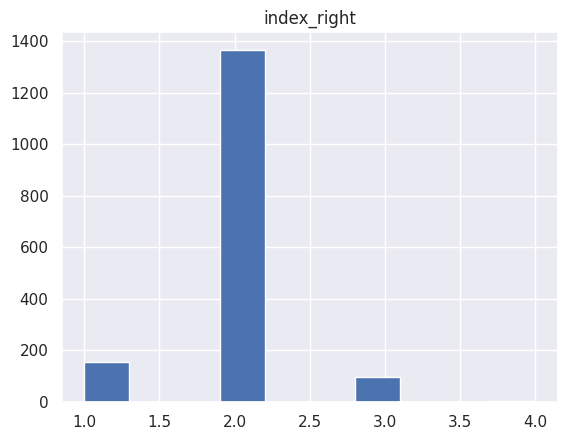

In [146]:
setor_by_intersection.groupby('cd_original_setor_censitario')[['index_right']].count().hist()

Curiosamente tem vários setores com apenas um distrito, mas todos tem interseção com ao menos um distrito, que é o mais importante.

In [147]:
setor_by_intersection[setor_by_intersection['index_right'].isna()]

,cd_original_setor_censitario,geometry,neg_buffer,index_right,cd_identificador_distrito,cd_distrito_municipal,cd_identificador_subprefeitura,nm_distrito_municipal,sg_distrito_municipal,distrito_geometry


Agora, crio uma nova coluna com o polígono da interseção entre o setor e o distrito.

In [148]:
setor_by_intersection.loc[:, 'intersection'] = setor_by_intersection.loc[:, 'neg_buffer'].intersection(setor_by_intersection.loc[:, 'distrito_geometry'])
setor_by_intersection.head(2)

,cd_original_setor_censitario,geometry,neg_buffer,index_right,cd_identificador_distrito,cd_distrito_municipal,cd_identificador_subprefeitura,nm_distrito_municipal,sg_distrito_municipal,distrito_geometry,intersection
44,355030801000045,"POLYGON ((339265.785 7391602.236, 339195.036 7...","POLYGON ((339188.130 7391648.662, 339216.436 7...",72,8583437,93,18,VILA PRUDENTE,VPR,"POLYGON ((341731.295 7388459.495, 341723.755 7...","POLYGON ((339190.691 7391649.916, 339196.540 7..."
44,355030801000045,"POLYGON ((339265.785 7391602.236, 339195.036 7...","POLYGON ((339188.130 7391648.662, 339216.436 7...",76,8583441,1,15,AGUA RASA,ARA,"POLYGON ((341093.380 7391912.491, 341093.329 7...","POLYGON ((339216.436 7391662.521, 339216.516 7..."


E calculo o percentual de interseção pela proporção entre as áreas das geometrias.

In [149]:
setor_by_intersection.loc[:, 'intersection_pct'] = setor_by_intersection.loc[:, 'intersection'].area/setor_by_intersection.loc[:, 'geometry'].area
setor_by_intersection.head(2)

,cd_original_setor_censitario,geometry,neg_buffer,index_right,cd_identificador_distrito,cd_distrito_municipal,cd_identificador_subprefeitura,nm_distrito_municipal,sg_distrito_municipal,distrito_geometry,intersection,intersection_pct
44,355030801000045,"POLYGON ((339265.785 7391602.236, 339195.036 7...","POLYGON ((339188.130 7391648.662, 339216.436 7...",72,8583437,93,18,VILA PRUDENTE,VPR,"POLYGON ((341731.295 7388459.495, 341723.755 7...","POLYGON ((339190.691 7391649.916, 339196.540 7...",0.000694
44,355030801000045,"POLYGON ((339265.785 7391602.236, 339195.036 7...","POLYGON ((339188.130 7391648.662, 339216.436 7...",76,8583441,1,15,AGUA RASA,ARA,"POLYGON ((341093.380 7391912.491, 341093.329 7...","POLYGON ((339216.436 7391662.521, 339216.516 7...",0.875515


Apenas para confirmação, vamos avaliar um dos setores censitários graficamente.

<Axes: >

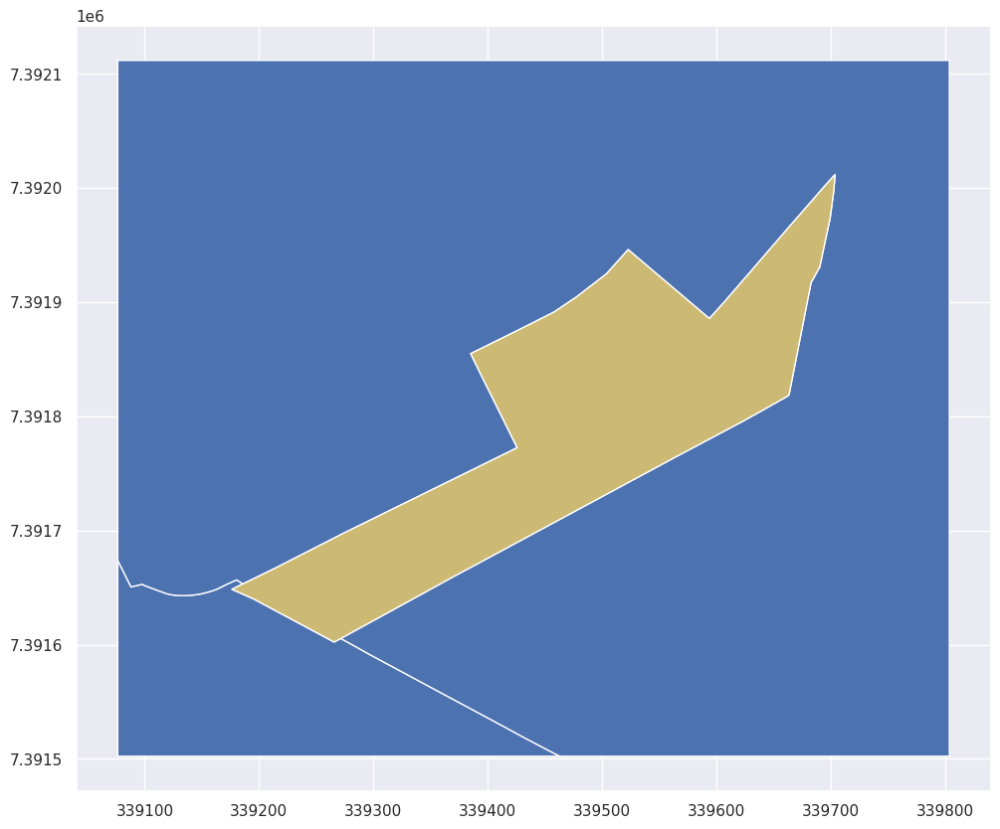

In [150]:
_plot = setor_by_intersection.loc[44]
_plot.loc[:, 'distrito_geometry'] = _plot.loc[:, 'distrito_geometry'].clip(_plot.loc[:, 'geometry'].buffer(10**2).total_bounds)
ax = _plot['distrito_geometry'].plot(figsize=(30,10))
_plot['geometry'].plot(color='y', ax=ax)

Agora, ordeno o novo GeoDataFrame pelo código do setor e percentual de interseção, com os distritos com maior interseção sendo colocados na frente.

In [151]:
setor_by_intersection = setor_by_intersection.sort_values(['cd_original_setor_censitario', 'intersection_pct'], ascending=[True, False])
setor_by_intersection

,cd_original_setor_censitario,geometry,neg_buffer,index_right,cd_identificador_distrito,cd_distrito_municipal,cd_identificador_subprefeitura,nm_distrito_municipal,sg_distrito_municipal,distrito_geometry,intersection,intersection_pct
44,355030801000045,"POLYGON ((339265.785 7391602.236, 339195.036 7...","POLYGON ((339188.130 7391648.662, 339216.436 7...",76,8583441,1,15,AGUA RASA,ARA,"POLYGON ((339076.408 7391673.750, 339076.408 7...","POLYGON ((339216.436 7391662.521, 339216.516 7...",0.875515
44,355030801000045,"POLYGON ((339265.785 7391602.236, 339195.036 7...","POLYGON ((339188.130 7391648.662, 339216.436 7...",72,8583437,93,18,VILA PRUDENTE,VPR,"POLYGON ((339076.408 7391502.237, 339076.408 7...","POLYGON ((339190.691 7391649.916, 339196.540 7...",0.000694
45,355030801000046,"POLYGON ((339176.365 7391648.432, 339165.704 7...","POLYGON ((339174.160 7391652.919, 339163.907 7...",76,8583441,1,15,AGUA RASA,ARA,"POLYGON ((341093.380 7391912.491, 341093.329 7...","POLYGON ((339095.957 7391655.148, 339095.820 7...",0.887755
45,355030801000046,"POLYGON ((339176.365 7391648.432, 339165.704 7...","POLYGON ((339174.160 7391652.919, 339163.907 7...",72,8583437,93,18,VILA PRUDENTE,VPR,"POLYGON ((341731.295 7388459.495, 341723.755 7...","POLYGON ((339163.907 7391647.907, 339150.139 7...",0.001980
72,355030801000073,"POLYGON ((339568.924 7391447.525, 339568.822 7...","POLYGON ((339574.581 7391451.144, 339576.701 7...",76,8583441,1,15,AGUA RASA,ARA,"POLYGON ((341093.380 7391912.491, 341093.329 7...","POLYGON ((339576.701 7391462.535, 339591.582 7...",0.841903
...,...,...,...,...,...,...,...,...,...,...,...,...
18900,355030896000195,"POLYGON ((354071.269 7397403.854, 354070.844 7...","POLYGON ((354066.219 7397402.972, 354065.898 7...",27,8583476,37,11,ITAQUERA,ITQ,"POLYGON ((353774.566 7397490.309, 353781.566 7...","POLYGON ((353887.481 7397237.188, 353870.144 7...",0.025011
18919,355030896000214,"POLYGON ((356886.449 7397208.364, 356864.932 7...","POLYGON ((356514.380 7397220.217, 356514.420 7...",10,8583486,96,12,LAJEADO,LAJ,"POLYGON ((357579.815 7394795.986, 357572.551 7...","POLYGON ((356514.420 7397220.220, 356514.429 7...",0.892212
18919,355030896000214,"POLYGON ((356886.449 7397208.364, 356864.932 7...","POLYGON ((356514.380 7397220.217, 356514.420 7...",64,8583428,84,10,VILA CURUCA,VCR,"POLYGON ((353376.344 7401351.654, 353541.902 7...","POLYGON ((356595.141 7397245.015, 356599.184 7...",0.013487
18948,355030896000243,"POLYGON ((358263.250 7395587.106, 358263.354 7...","POLYGON ((358260.618 7395579.028, 358267.959 7...",10,8583486,96,12,LAJEADO,LAJ,"POLYGON ((357579.815 7394795.986, 357572.551 7...","POLYGON ((358267.959 7395555.687, 358268.228 7...",0.771440


Finalmente, mantenho apenas as linhas com os distritos com maior interseção.

In [152]:
setor_by_largest = setor_by_intersection.drop_duplicates('cd_original_setor_censitario', keep='first')
setor_by_largest

,cd_original_setor_censitario,geometry,neg_buffer,index_right,cd_identificador_distrito,cd_distrito_municipal,cd_identificador_subprefeitura,nm_distrito_municipal,sg_distrito_municipal,distrito_geometry,intersection,intersection_pct
44,355030801000045,"POLYGON ((339265.785 7391602.236, 339195.036 7...","POLYGON ((339188.130 7391648.662, 339216.436 7...",76,8583441,1,15,AGUA RASA,ARA,"POLYGON ((339076.408 7391673.750, 339076.408 7...","POLYGON ((339216.436 7391662.521, 339216.516 7...",0.875515
45,355030801000046,"POLYGON ((339176.365 7391648.432, 339165.704 7...","POLYGON ((339174.160 7391652.919, 339163.907 7...",76,8583441,1,15,AGUA RASA,ARA,"POLYGON ((341093.380 7391912.491, 341093.329 7...","POLYGON ((339095.957 7391655.148, 339095.820 7...",0.887755
72,355030801000073,"POLYGON ((339568.924 7391447.525, 339568.822 7...","POLYGON ((339574.581 7391451.144, 339576.701 7...",76,8583441,1,15,AGUA RASA,ARA,"POLYGON ((341093.380 7391912.491, 341093.329 7...","POLYGON ((339576.701 7391462.535, 339591.582 7...",0.841903
73,355030801000074,"POLYGON ((339568.822 7391447.524, 339563.190 7...","POLYGON ((339564.910 7391453.833, 339564.556 7...",76,8583441,1,15,AGUA RASA,ARA,"POLYGON ((341093.380 7391912.491, 341093.329 7...","POLYGON ((339538.425 7391461.866, 339475.354 7...",0.914625
92,355030801000093,"POLYGON ((341036.473 7391421.585, 341033.873 7...","POLYGON ((341031.503 7391422.126, 341028.903 7...",76,8583441,1,15,AGUA RASA,ARA,"POLYGON ((341093.380 7391912.491, 341093.329 7...","POLYGON ((341028.903 7391398.402, 341019.784 7...",0.908380
...,...,...,...,...,...,...,...,...,...,...,...,...
18891,355030896000186,"POLYGON ((358201.435 7398123.903, 358204.410 7...","POLYGON ((358196.858 7398121.582, 358199.556 7...",10,8583486,96,12,LAJEADO,LAJ,"POLYGON ((357579.815 7394795.986, 357572.551 7...","POLYGON ((358199.556 7398110.661, 358199.603 7...",0.840678
18900,355030896000195,"POLYGON ((354071.269 7397403.854, 354070.844 7...","POLYGON ((354066.219 7397402.972, 354065.898 7...",10,8583486,96,12,LAJEADO,LAJ,"POLYGON ((357579.815 7394795.986, 357572.551 7...","POLYGON ((354065.898 7397396.527, 354059.638 7...",0.759777
18919,355030896000214,"POLYGON ((356886.449 7397208.364, 356864.932 7...","POLYGON ((356514.380 7397220.217, 356514.420 7...",10,8583486,96,12,LAJEADO,LAJ,"POLYGON ((357579.815 7394795.986, 357572.551 7...","POLYGON ((356514.420 7397220.220, 356514.429 7...",0.892212
18948,355030896000243,"POLYGON ((358263.250 7395587.106, 358263.354 7...","POLYGON ((358260.618 7395579.028, 358267.959 7...",10,8583486,96,12,LAJEADO,LAJ,"POLYGON ((357579.815 7394795.986, 357572.551 7...","POLYGON ((358267.959 7395555.687, 358268.228 7...",0.771440


In [153]:
assert setor_by_largest.shape[0] == not_covered.sum(), 'O número de setores no dataframe baseado na maior interseção não é igual ao número de setores não cobertos por um distrito'

## Resultado final

Finalmente, crio um novo GeoDataFrame com os recortes dos dois tipos de join ('covered by' e maior interseção)

In [155]:
final_gdf = pd.concat([
    join[~not_covered],
    setor_by_largest
])
final_gdf

,cd_original_setor_censitario,geometry,neg_buffer,index_right,cd_identificador_distrito,cd_distrito_municipal,cd_identificador_subprefeitura,nm_distrito_municipal,sg_distrito_municipal,distrito_geometry,intersection,intersection_pct
0,355030801000001,"POLYGON ((339816.876 7392593.185, 339762.085 7...","POLYGON ((339811.755 7392597.939, 339762.474 7...",76.0,8583441.0,1,15.0,AGUA RASA,ARA,None,None,NaN
1,355030801000002,"POLYGON ((339898.791 7392663.965, 339890.991 7...","POLYGON ((339899.095 7392678.294, 339895.768 7...",76.0,8583441.0,1,15.0,AGUA RASA,ARA,None,None,NaN
2,355030801000003,"POLYGON ((340010.027 7392443.461, 339999.011 7...","POLYGON ((340005.485 7392446.082, 339996.059 7...",76.0,8583441.0,1,15.0,AGUA RASA,ARA,None,None,NaN
3,355030801000004,"POLYGON ((340035.826 7392138.185, 339960.781 7...","POLYGON ((339810.123 7392962.457, 339813.419 7...",76.0,8583441.0,1,15.0,AGUA RASA,ARA,None,None,NaN
4,355030801000005,"POLYGON ((339655.092 7392153.506, 339647.532 7...","POLYGON ((339655.932 7392160.639, 339651.503 7...",76.0,8583441.0,1,15.0,AGUA RASA,ARA,None,None,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
18891,355030896000186,"POLYGON ((358201.435 7398123.903, 358204.410 7...","POLYGON ((358196.858 7398121.582, 358199.556 7...",10.0,8583486.0,96,12.0,LAJEADO,LAJ,"POLYGON ((357579.815 7394795.986, 357572.551 7...","POLYGON ((358199.556 7398110.661, 358199.603 7...",0.840678
18900,355030896000195,"POLYGON ((354071.269 7397403.854, 354070.844 7...","POLYGON ((354066.219 7397402.972, 354065.898 7...",10.0,8583486.0,96,12.0,LAJEADO,LAJ,"POLYGON ((357579.815 7394795.986, 357572.551 7...","POLYGON ((354065.898 7397396.527, 354059.638 7...",0.759777
18919,355030896000214,"POLYGON ((356886.449 7397208.364, 356864.932 7...","POLYGON ((356514.380 7397220.217, 356514.420 7...",10.0,8583486.0,96,12.0,LAJEADO,LAJ,"POLYGON ((357579.815 7394795.986, 357572.551 7...","POLYGON ((356514.420 7397220.220, 356514.429 7...",0.892212
18948,355030896000243,"POLYGON ((358263.250 7395587.106, 358263.354 7...","POLYGON ((358260.618 7395579.028, 358267.959 7...",10.0,8583486.0,96,12.0,LAJEADO,LAJ,"POLYGON ((357579.815 7394795.986, 357572.551 7...","POLYGON ((358267.959 7395555.687, 358268.228 7...",0.771440


In [156]:
assert final_gdf.shape[0] == setor.shape[0], 'O número de setores no GeoDataFrame final não é o número total de setores avaliados'